<h1><center><strong>PRACTICA Nº1</strong></center></h1>
<p><strong>Name</strong> : Carlos Enciso<p>  
<p><strong>Email</strong> : carlos.enciso.o@gmail.com<p>  
<h4><strong>Aims:</strong></h4>
<ol>
    <li>Obtener la serie temporal de lluvia de un punto geográfico.</li>
    <li>Presentar un mapa con la ubicación del punto seleccionado</li>
    <li>Calcular las medidas de estadística descriptiva.</li>
    <li>Obtener la Climatología.</li>
    <li>Representar gráficamente.</li>
    <li>Justificar la elección de la base de datos TRMM o PISCO para el punto escogido.</li>
    <li>Redactar describiendo los resultados obtenidos.</li>
</ol> 

In [1]:
%%capture
#======================================
# Importing Libraries 
#======================================
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import xarray as xr
import geopandas as gpd
import cartopy.crs as ccrs
import cmocean as cmo
from rasterio import features
from affine import Affine
import mplleaflet
import os
import eofs
import string
import seaborn as sns
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as mticker
from cartopy.io.shapereader import Reader
from shapely.geometry.polygon import LinearRing
from pandas.tseries import converter

In [2]:
#---------------------------
# Reading datasets 
#---------------------------
fili = './DATASETS/new_PISCO2.nc'
ds = xr.open_dataset(fili, decode_cf=False)
ds = xr.decode_cf(ds)

<h4><strong>Sol:</strong></h4>
<ol>
    <li>Obtener la serie temporal de lluvia de un punto geográfico.</li>
</ol>

In [3]:
#------------------------
# Setting coordinates
#------------------------
lats,lons = [-11.987444, -76.841944]
ds_point = ds.sel(lat=lats,lon=lons, method='nearest')

Text(0, 0.5, 'Rainfall (mm)')

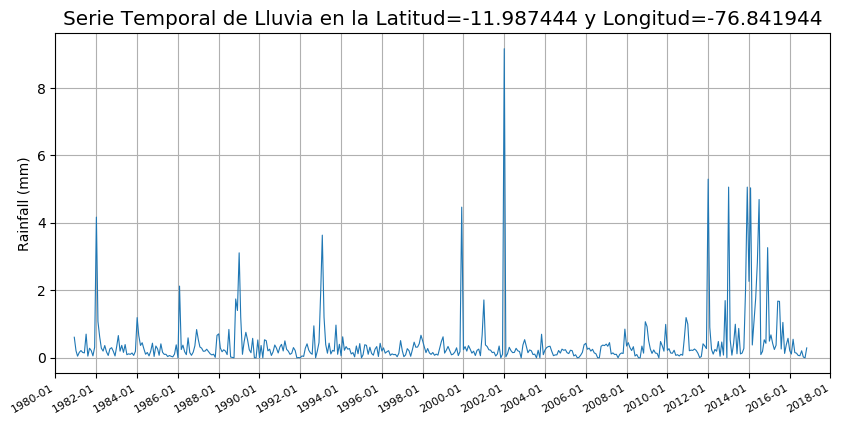

In [4]:
fig, ax = plt.subplots(figsize=(10,5), dpi=100)
plt.style.use('ggplot')
ds_series = ds_point.P.to_series()
ds_series.plot(ax=ax, linewidth=.8)
dates_rng = pd.date_range('1980-01-01', '2018-12-01', freq='24M')
plt.xticks(dates_rng, [dtz.strftime('%Y-%m') for dtz in dates_rng], rotation=30, size=8)
plt.title('Serie Temporal de Lluvia en la Latitud={} y Longitud={}'.format(lats,lons))
plt.xlabel('')
plt.ylabel('Rainfall (mm)')

<h4><strong>Sol:</strong></h4>
<ol start="3">
    <li>Presentar un mapa con la ubicación del punto seleccionado.</li>
</ol>

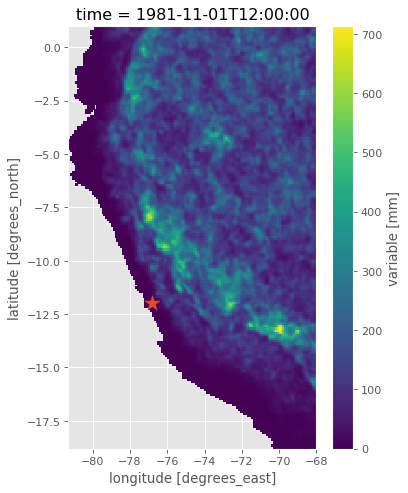

In [5]:
fig, ax = plt.subplots(figsize=(5,7), dpi=80)
ds.P.isel(time=10).plot(ax=ax)
ax.scatter(lons,lats, marker='*', s=200)
plt.grid(True)

<h4><strong>Sol:</strong></h4>
<ol start=3>
    <li>Calcular las medidas de estadística descriptiva.</li>
</ol> 

In [6]:
[mean, std] = [ds_point.mean(), ds_point.std()]

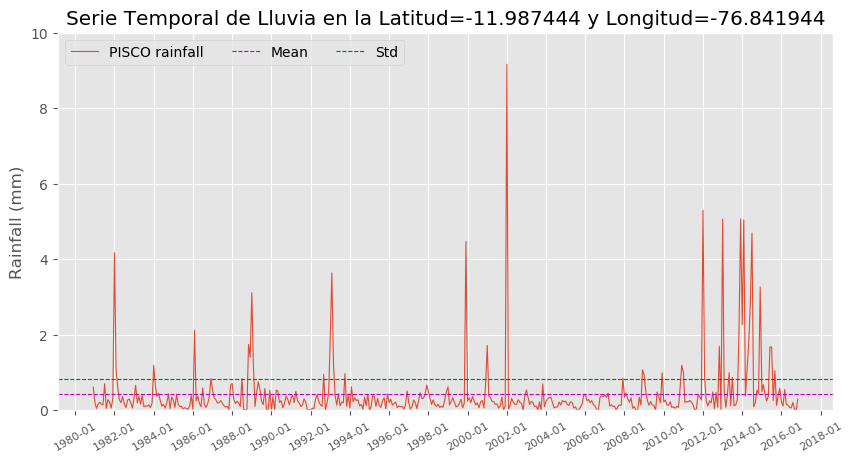

In [7]:
fig, ax = plt.subplots(figsize=(10,5), dpi=100)
plt.style.use('ggplot')
ds_series = ds_point.P.to_series()
ax.plot(ds_series, linewidth=.8, label='PISCO rainfall')
ax.axhline(y=mean.P.values, linewidth=.8, color='m', linestyle='--', label='Mean')
ax.axhline(y=std.P.values, linewidth=.8, color='green', linestyle='--', label='Std')
dates_rng = pd.date_range('1980-01-01', '2018-12-01', freq='24M')
plt.xticks(dates_rng, [dtz.strftime('%Y-%m') for dtz in dates_rng], rotation=30, size=8)
plt.title('Serie Temporal de Lluvia en la Latitud={} y Longitud={}'.format(lats,lons))
plt.xlabel('')
plt.ylabel('Rainfall (mm)')
ax.set_ylim(0, 10)
plt.legend(ncol=3)

<h4><strong>Sol:</strong></h4>
<ol start=4>
    <li>Obtener la Climatología.</li>
</ol> 

In [8]:
ds_climatology = ds_point.groupby('time.month').mean('time')

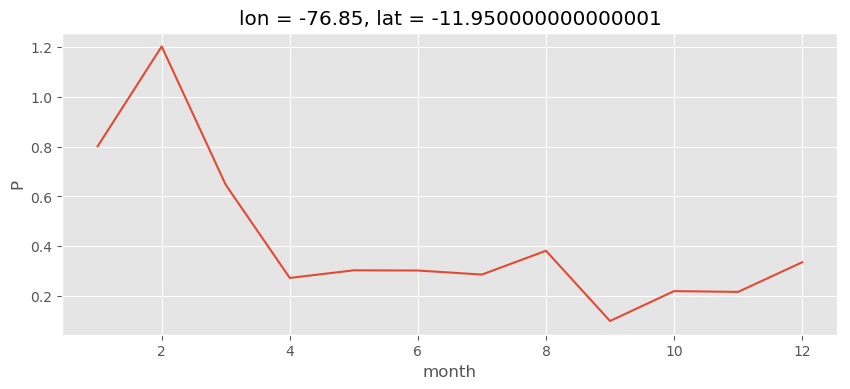

In [9]:
fig, ax = plt.subplots(figsize=(10,4), dpi=100)
ds_climatology.P.plot(ax=ax)

<h4><strong>Sol:</strong></h4>
<ol start=5>
    <li>Justificar la elección de la base de datos TRMM o PISCO para el punto escogido.</li>
</ol> 

In [10]:
df = pd.read_pickle('./DATASETS/ÑAÑA_stations_SENAMHI')
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Lon, df.Lat))

In [11]:
#-------------------------------------------
# Plotting point from SENAMHI database
#-------------------------------------------
def plotting_station(stations_points):
    fig, ax = plt.subplots(figsize=(8,10), dpi=60)
    stations_points.plot(ax=ax, facecolor='m')
    crs = {'init' :'epsg:32717'}
    return mplleaflet.display(fig,crs=stations_points.crs)

In [12]:
plotting_station(gdf)

/home/carlos/miniconda3/envs/py37/lib/python3.6/site-packages/IPython/core/display.py:689: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


In [13]:
df_prec = df[['PP','Date']]

In [14]:
df_prec_monthly = df_prec.resample('M', on='Date').sum()

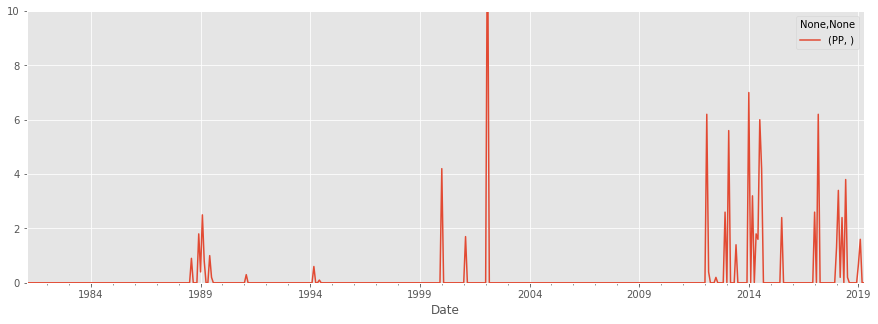

In [15]:
df_prec_monthly.plot(figsize=(15,5), ylim=(0,10))

In [16]:
ds_trmm = xr.open_dataset('./DATASETS/TRMM_3B432_2001_2014.nc', decode_cf=False)
ds_trmm = xr.decode_cf(ds_trmm)

In [17]:
#------------------------
# Setting coordinates
#------------------------
ds_trmm_point = ds_trmm.sel(latitude=lats,longitude=lons, method='nearest')

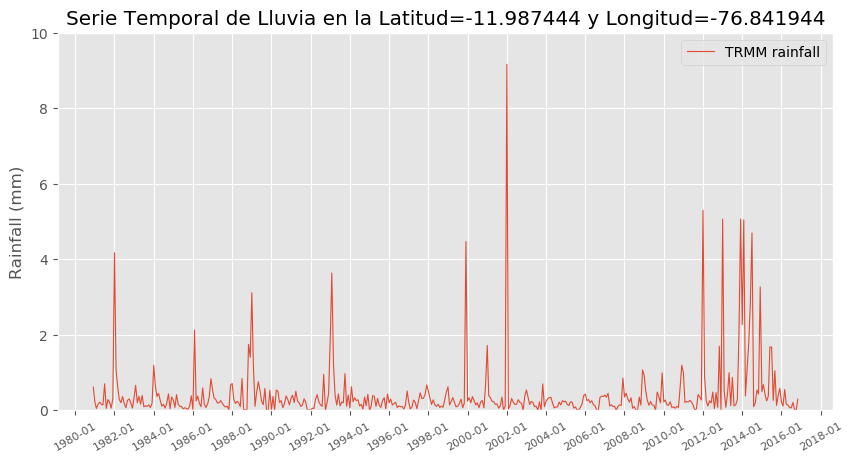

In [18]:
fig, ax = plt.subplots(figsize=(10,5), dpi=100)
plt.style.use('ggplot')
ds_trmm_series = ds_trmm_point.pcp.to_series()
ax.plot(ds_series, linewidth=.8, label='TRMM rainfall')
dates_rng = pd.date_range('1980-01-01', '2018-12-01', freq='24M')
plt.xticks(dates_rng, [dtz.strftime('%Y-%m') for dtz in dates_rng], rotation=30, size=8)
plt.title('Serie Temporal de Lluvia en la Latitud={} y Longitud={}'.format(lats,lons))
plt.xlabel('')
plt.ylabel('Rainfall (mm)')
ax.set_ylim(0, 10)
plt.legend(ncol=3)